In [1]:
%matplotlib widget

from os import path
from glob import glob
import pickle

import numpy as np
from scipy.optimize import curve_fit
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import TwoSlopeNorm
import networkx as nx

In [2]:
processed_folder = '../data/processed/'
raw_folder = '../data/raw/'

node_order = np.array(['FN', 'PERI', 'RE', 'ENTI', 'ORB', 'BLA', 'PIR'])
node_c_avi =  ["#00FFFF","#0000FF", "#ADD8E6", "#0000CD", "#808000", "#008000", "#006400", "#8B4513"]
node_c_nim = ['#FF0000', '#00FF00',  '#0000FF',  '#FFFF00',  '#00FFFF', '#FF00FF', '#FFA500', '#800080']
color_seq =['ORB', 'MO', 'VIS', 'OLF', 'HTh', 'HIPP','MID','HIND']

node_c_avi = dict(zip(color_seq, node_c_avi))
node_c_nim = dict(zip(color_seq, node_c_nim))

# Basic metrics

In [3]:
# read transition time data
transition_times = {}
for f in glob(path.join(processed_folder, 'tt*.bz2')):
    df = pd.read_pickle(f, compression='bz2').rename({'Full Network':'FN'}, axis=1)
    transition_times[df.columns[0]] = df.iloc[:, 0].values

# read synchronized time data
sync_times = {}
for f in glob(path.join(processed_folder, 'st*.bz2')):
    df = pd.read_pickle(f, compression='bz2').rename({'Full Network':'FN'}, axis=1)
    sync_times[df.columns[0]] = df.iloc[:, 0].values

# read number of transitions data
with open(path.join(processed_folder, 'tran_num.pkl'), 'rb') as f:
    n_trans = pickle.load(f)

# define node order based on the number of transitions
non = np.r_[np.argsort([n_trans[k][-1]/1000 for k in node_order[1:]])+1, 0]

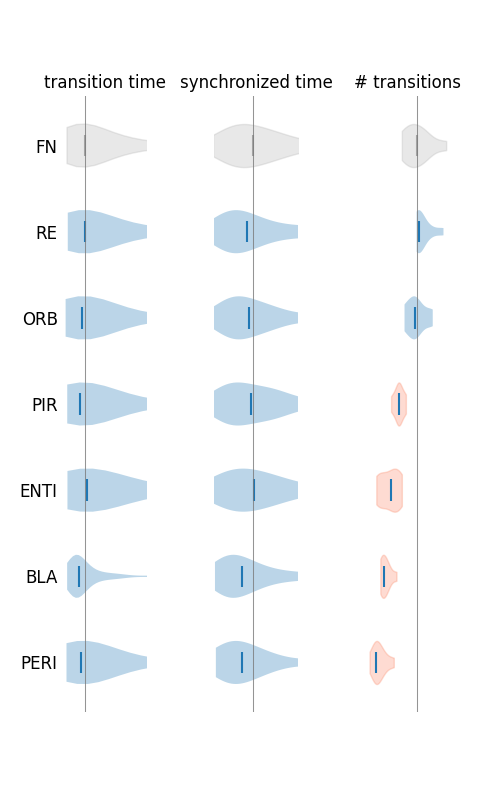

In [92]:
# f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(5, 8), sharey=True)
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(5, 8), sharey=True)

_artists = ax1.violinplot([transition_times[k] for k in node_order[non]], vert=False, showextrema=False, showmedians=True)
ax1.set_yticks(np.arange(1, len(node_order)+1))
ax1.set_yticklabels(node_order[non], fontsize=12)
_artists['bodies'][-1].set_color(cm.Greys(0.4, 0.4))
_artists['cmedians'].set_color(list(_artists['cmedians'].get_color())*6+[cm.Greys(0.8, 0.4)])
ax1.spines[['left', 'right', 'top', 'bottom']].set_visible(False)
ax1.set_xticks([])
ax1.set_xlim(20, 100)
ax1.tick_params(axis=u'both', which=u'both', length=0)
ax1.set_title('transition time')
ax1.axvline(np.median(transition_times['FN']), c=cm.Greys(0.6, 0.8), lw=0.75)

_artists = ax2.violinplot([sync_times[k] for k in node_order[non]], vert=False, showextrema=False, showmedians=True)
# ax2.set_yticks(np.arange(1, len(node_order)+1))
# ax1.set_yticklabels(node_order)
_artists['bodies'][-1].set_color(cm.Greys(0.4, 0.4))
_artists['cmedians'].set_color(list(_artists['cmedians'].get_color())*6+[cm.Greys(0.8, 0.4)])
ax2.spines[['left', 'right', 'top', 'bottom']].set_visible(False)
ax2.set_xticks([])
ax2.set_xlim(80, 500)
ax2.tick_params(axis=u'both', which=u'both', length=0)
ax2.set_title('synchronized time')
ax2.axvline(np.median(sync_times['FN']), c=cm.Greys(0.6, 0.8), lw=0.75)

_artists = ax3.violinplot([np.diff(np.array(n_trans[k])) for k in node_order[non]], vert=False, showextrema=False, showmedians=True)
# ax3.set_yticks(np.arange(1, len(node_order)+1))
# ax3.set_yticklabels(node_order)
_artists['bodies'][-1].set_color(cm.Greys(0.4, 0.4))
for i in range(4):
    _artists['bodies'][i].set_color(cm.Reds(0.4, 0.4))
_artists['cmedians'].set_color(list(_artists['cmedians'].get_color())*6+[cm.Greys(0.8, 0.4)])
ax3.spines[['left', 'right', 'top', 'bottom']].set_visible(False)
ax3.set_xticks([])
# ax3.set_xlim(80, 500)
ax3.tick_params(axis=u'both', which=u'both', length=0)
ax3.set_title('# transitions')
ax3.axvline(np.median(np.diff(n_trans['FN'])), c=cm.Greys(0.6, 0.8), lw=0.75)

# # requires `metrics` which is loaded in 'All networks' section
# _artists = ax4.violinplot(metrics['high'].unstack(level='noi', sort=False).apply(lambda c: list(c.dropna())), vert=False, showextrema=False, showmedians=True)
# # ax3.set_yticks(np.arange(1, len(node_order)+1))
# # ax3.set_yticklabels(node_order)
# _artists['bodies'][-1].set_color(cm.Greys(0.4, 0.4))
# for i in range(4):
#     _artists['bodies'][i].set_color(cm.Reds(0.4, 0.4))
# _artists['cmedians'].set_color(list(_artists['cmedians'].get_color())*6+[cm.Greys(0.8, 0.4)])
# ax4.spines[['left', 'right', 'top', 'bottom']].set_visible(False)
# ax4.set_xticks([])
# # ax3.set_xlim(80, 500)
# ax4.tick_params(axis=u'both', which=u'both', length=0)
# ax4.set_title('sync level')
# ax4.axvline(metrics['high'].loc['FN'].median(), c=cm.Greys(0.6, 0.8), lw=0.75)

f.subplots_adjust(wspace=0.8)

# Time of entry and propagation

In [5]:
# read communities data
with open('Mouse brain network/MouseBrainLib/mb_communities_dict.pickle', 'rb') as f:
    communities = pickle.load(f)

community_names = {
    0:'MO', 1:'MID', 2:'VIS', 3:'ORB', 4:'HTh', 5:'HIND', 6:'OLF', 7:'HIPP'
}

communities = {
    community_names[i]:v for i, v in communities.items()
}

community_map = pd.concat([pd.Series(data=k, index=v) for k, v in communities.items()])
fn_sync_order = ['HIND', 'MID', 'HIPP', 'VIS', 'MO', 'HTh', 'ORB', 'OLF']
sort_order = {
    fn_sync_order[i]:i for i in range(len(fn_sync_order))
}

{k:len(v) for k, v in communities.items()}

{'MO': 56,
 'VIS': 50,
 'ORB': 34,
 'HTh': 44,
 'OLF': 36,
 'HIPP': 50,
 'MID': 70,
 'HIND': 86}

In [6]:
# NEW
def binarize(_nc):
    final_cluster_id = _nc.loc[(_nc.name, 4999)].value_counts().idxmax()
    if final_cluster_id==0:
        print('Skipping transition', _nc.name)
        return None
    _nc.replace(final_cluster_id, -1, inplace=True)
    _nc[_nc>0] = 1
    # _nc.replace(0, np.nan, inplace=True)
    return -_nc.loc[_nc.name]

def sigmoid(x, center, slope, vmin, vmax):
    return vmin + (vmax-vmin)/2*(1+np.tanh((x-center)/slope))

def get_bnc_fit(s):
    try:
        (_c, _s, _n, _x), _ = curve_fit(sigmoid, s.index, s.rolling(40).mean().fillna(0))
        if _c<3000 or _c>5000 or _x<0.2 or _n<-0.1 or _n>0.1:
            pass
        else:
            return pd.Series(dict(toe=_c, var=_s, low=_n, high=_x))
    except:
        pass
    return pd.Series(dict(toe=np.nan, var=np.nan, low=np.nan, high=np.nan))

def get_nc_metrics(nc):
    bnc = nc.groupby(level=0).apply(binarize)
    mnc = bnc.groupby(level=1).mean().T
    mnc.index = pd.MultiIndex.from_frame(mnc.index.rename('node').to_frame().join(community_map.rename('community')).join(community_map.map(sort_order).rename('sort')))
    # compute time of entry and sort nodes by toe
    metrics = bnc.apply(lambda s: get_bnc_fit(s.unstack(level=1).mean())).T
    metrics.index = mnc.index
    # sort nodes by time of entry within each community
    metrics = metrics.sort_index(level='sort', ascending=False).groupby('community', sort=False).apply(lambda s: s.sort_values(by='toe')).droplevel(0)
    return metrics

### Individual network analysis

In [108]:
# read example node_communities data
nc = pd.read_pickle('../data/raw/check_20/nc_orb_20.bz2', compression='bz2')
bnc = nc.groupby(level=0).apply(binarize)
mnc = bnc.groupby(level=1).mean().T
mnc.index = pd.MultiIndex.from_frame(mnc.index.rename('node').to_frame().join(community_map.rename('community')).join(community_map.map(sort_order).rename('sort')))
# toe = pd.read_pickle('../data/raw/check_20/toe_fn_20.bz2', compression='bz2')

Skipping transition 11
Skipping transition 12
Skipping transition 14
Skipping transition 20


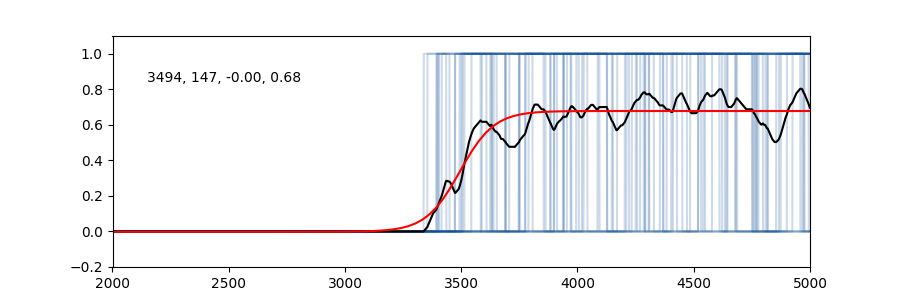

In [118]:
# membership of node in sync cluster across repeated transitions
_node = 59
f, ax = plt.subplots(figsize=(9, 3))
bnc[_node].unstack(level=0).plot(ax=ax, c=cm.Blues(0.9, 0.2))
bnc[_node].unstack(level=1).mean().rolling(40).mean().plot(ax=ax, c='k')
ax.get_legend().set_visible(False)
ax.set_xlim(2000, 5000)
ax.set_ylim(-0.2, 1.1)
(_c, _s, _n, _x), _ = curve_fit(sigmoid, bnc.index.levels[1], bnc[_node].unstack(level=1).mean().rolling(40).mean().fillna(0))
ax.plot(np.linspace(2000, 5000, 100), sigmoid(np.linspace(2000, 5000, 100), _c, _s, _n, _x), c='r')
ax.annotate(f'{_c:.0f}, {_s:.0f}, {_n:.2f}, {_x:.2f}', (0.05, 0.8), xycoords='axes fraction');

In [110]:
# compute time of entry and sort nodes by toe
toe = bnc.apply(lambda s: get_mean_toe(s.unstack(level=1).mean()))
toe[toe<3000] = np.nan
toe.fillna(5000, inplace=True)
toe.index = mnc.index
# sort nodes by time of entry within each community
toe = toe.sort_index(level='sort', ascending=False).groupby('community', sort=False).apply(lambda s: s.sort_values()).droplevel(0)

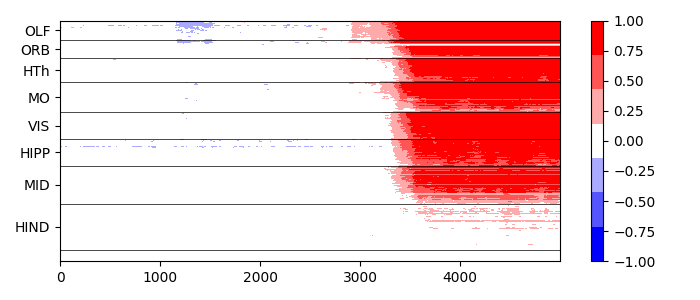

In [111]:
# plot mean binarized sync cluster membership matrix

f, ax = plt.subplots(1, 1, figsize=(7, 3), tight_layout=True)
cb = ax.imshow(mnc.loc[toe.index], aspect='auto', cmap=plt.get_cmap('bwr', 7), norm=TwoSlopeNorm(0))
plt.colorbar(cb)
i = 0
ticks = []
for com in sorted(mnc.index.levels[1], key=lambda x: sort_order[x], reverse=True):
    ticks.append(i+len(communities[com])/2)
    i += len(communities[com])
    ax.axhline(i, c='k', lw=0.5)
ax.set_yticks(ticks)
ax.set_yticklabels(sorted(mnc.index.levels[1], key=lambda x: sort_order[x], reverse=True));

### All networks

In [10]:
# # NEW
# ncs, metrics = {}, {}
# for f in glob(path.join(raw_folder, 'check_20', 'nc*.bz2')):
#     net = str.upper(path.basename(f).split('_')[1])
#     print('Processing', net)
#     ncs[net] = pd.read_pickle(f, compression='bz2')
#     metrics[net] = get_nc_metrics(ncs[net])

# metrics = pd.concat(metrics, names=['noi', 'node', 'community', 'sort'])
# metrics.to_pickle('metrics.pkl')

metrics = pd.read_pickle('metrics.pkl')
metrics

toe         var       low      high
noi node community sort                                             
RE  77   OLF       7     3298.943580  213.434903 -0.094438  1.000185
    290  OLF       7     3305.571779  186.819613 -0.078855  0.994477
    283  OLF       7     3306.928060  201.354803 -0.086569  1.007474
    43   OLF       7     3311.274135  256.167879 -0.067025  0.989107
    47   OLF       7     3312.111804  233.524179 -0.063781  1.001423
...                              ...         ...       ...       ...
ORB 176  HIND      0             NaN         NaN       NaN       NaN
    171  HIND      0             NaN         NaN       NaN       NaN
    169  HIND      0             NaN         NaN       NaN       NaN
    165  HIND      0             NaN         NaN       NaN       NaN
    164  HIND      0             NaN         NaN       NaN       NaN

[2982 rows x 4 columns]

In [11]:
# toes based on node_communities binarized fits NEW
toes = metrics['toe'].unstack(level=0).T
toes[toes>5000] = 5000
# sort by time of entry in FN
toes = toes[
    toes.loc['FN']
    .sort_index(level='sort', ascending=False)
    .groupby('community', sort=False, dropna=False)
    .apply(lambda s: s.sort_values())
    .droplevel(0)
    .index
].T
toes = toes[node_order]
toes

,,noi,FN,PERI,RE,ENTI,ORB,BLA,PIR
node,community,sort,,,,,,,
39,OLF,7,3239.068308,3317.628223,3320.787970,3316.932541,3300.933442,3301.957025,3377.137212
62,OLF,7,3239.551313,3314.940693,3317.737577,3284.441937,3220.903799,3320.710199,3333.563717
61,OLF,7,3239.994655,3306.892336,NaN,3311.219428,3248.566966,3309.140510,3326.477440
274,OLF,7,3240.622782,3335.981121,NaN,3331.872425,3240.357484,3307.630067,3318.513789
44,OLF,7,3247.269650,3317.237233,NaN,3309.064258,3268.416856,3325.077462,3346.333817
...,...,...,...,...,...,...,...,...,...
172,HIND,0,NaN,3478.385916,NaN,NaN,3413.578916,NaN,3442.689479
171,HIND,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
169,HIND,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [141]:
mean_toe.T - mean_toe['FN']

community,ORB,OLF,HIPP,HTh,MO,VIS,MID,HIND
noi,,,,,,,,
FN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PERI,57.278879,67.824028,44.122566,29.226708,19.523324,11.309515,-11.581203,-33.727667
RE,56.750221,59.875272,30.853502,23.379128,12.710069,2.390365,-13.923967,-47.143238
ENTI,49.157383,45.373629,25.198694,44.171312,24.443796,-7.873668,-6.740575,-87.331632
ORB,-12.148269,-18.164509,-23.521825,-38.422719,-18.147473,-22.902366,11.084755,-89.038129
BLA,62.326210,57.111537,56.234863,5.504928,28.328026,-36.602345,-61.908701,-86.809383
PIR,69.821855,79.445481,51.738350,55.941290,37.533372,-4.914966,-0.394852,-46.663625


<Axes: xlabel='noi'>

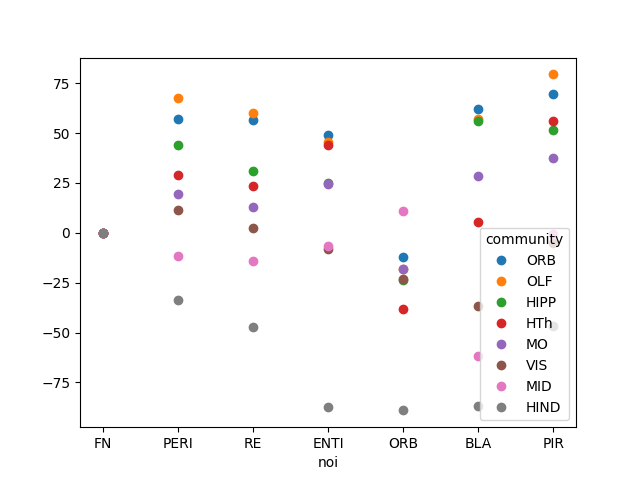

In [142]:
f, ax = plt.subplots()
mean_toe = toes.groupby('community').apply(lambda s: s.min()).sort_values(by='FN')
(mean_toe.T-mean_toe['FN']).plot(ax=ax, ls='', marker='o')

In [12]:
# toes based on latest time of entry
toes2 = {}
for f in glob(path.join(raw_folder, 'check_20', 'toe*.bz2')):
    net = path.basename(f).split('_')[1]
    toes2[net] = pd.read_pickle(f, compression='bz2').mean()
toes2 = pd.concat(toes2).unstack(level=0).T
toes2.index = toes2.index.str.upper()
toes2 = toes2.T[node_order]
idx = toes2.index.rename('node').to_frame()
idx['community'] = toes2.index.map(lambda x: community_map[x])
idx['sort'] = toes2.index.map(lambda x: fn_sync_order.index(community_map[x]))
toes2.index = pd.MultiIndex.from_frame(idx)
toes2 = (toes2
         .sort_index(level='sort', ascending=False)
         .groupby(level='community', sort=False)
         .apply(lambda df: df.sort_values(by='FN'))
         .droplevel(0)
        )
toes2

,,,FN,PERI,RE,ENTI,ORB,BLA,PIR
node,community,sort,,,,,,,
252,OLF,7,3476.65,3521.00,3792.000000,3750.904762,3610.05,3690.588235,3951.476190
274,OLF,7,3498.15,3486.20,3663.333333,3625.333333,3521.35,3597.764706,3744.142857
62,OLF,7,3506.15,3500.45,3738.055556,3703.619048,3590.95,3675.058824,3632.476190
61,OLF,7,3506.35,3440.15,3707.611111,3776.904762,3667.70,3653.647059,3658.857143
77,OLF,7,3514.25,3587.35,3771.222222,3774.761905,3625.20,3714.235294,3685.000000
...,...,...,...,...,...,...,...,...,...
180,HIND,0,4999.00,4999.00,4999.000000,4999.000000,4999.00,4999.000000,4999.000000
179,HIND,0,4999.00,4999.00,4999.000000,4999.000000,4999.00,4999.000000,4999.000000
178,HIND,0,4999.00,4999.00,4999.000000,4999.000000,4999.00,4999.000000,4999.000000


In [106]:
metrics['var'].swaplevel(1, 2).swaplevel(-1, -2).loc[s.index].quantile([0.01, 0.99])

0.01     65.703777
0.99    287.195440
Name: var, dtype: float64

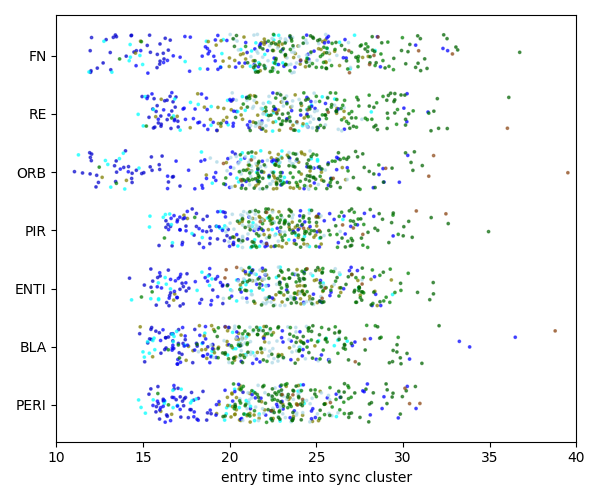

In [107]:
_no = node_order[non]

s = (toes.stack().swaplevel(0, -1).sort_index(level='sort', ascending=False).loc[_no].groupby(level=[0, 1], sort=False).apply(lambda s: s.sort_values()).droplevel([0, 1])-3000)*0.05
x = s.groupby(level=0, sort=False).apply(lambda _s: pd.Series(list(_no).index(_s.name)-0.3+np.random.rand(len(_s))/1.5))#np.arange(len(_s))/1000)
c = pd.Series(s.index.get_level_values('community').map(lambda x: node_c_avi[x]), index=s.index)

f, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
ax.scatter(s, x, c=c, s=3, alpha=0.6)
ax.set_yticks(range(len(_no)))
ax.set_yticklabels(_no)
ax.set_xlabel('entry time into sync cluster')
ax.set_xlim(10, 40);

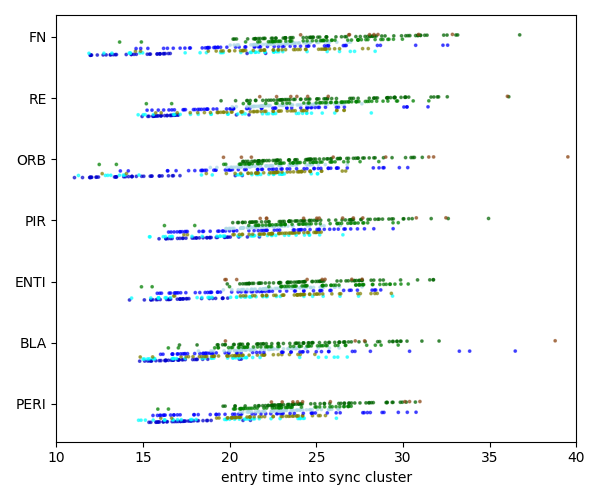

In [143]:
_no = node_order[non]

s = (toes.stack().swaplevel(0, -1).sort_index(level='sort', ascending=False).loc[_no].groupby(level=[0, 1], sort=False).apply(lambda s: s.sort_values()).droplevel([0, 1])-3000)*0.05
x = s.groupby(level=0, sort=False).apply(lambda _s: pd.Series(list(_no).index(_s.name)-0.3+np.arange(len(_s))/1000))#np.arange(len(_s))/1000)np.random.rand(len(_s))/1.5)
c = pd.Series(s.index.get_level_values('community').map(lambda x: node_c_avi[x]), index=s.index)

f, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
ax.scatter(s, x, c=c, s=3, alpha=0.6)
ax.set_yticks(range(len(_no)))
ax.set_yticklabels(_no)
ax.set_xlabel('entry time into sync cluster')
ax.set_xlim(10, 40);

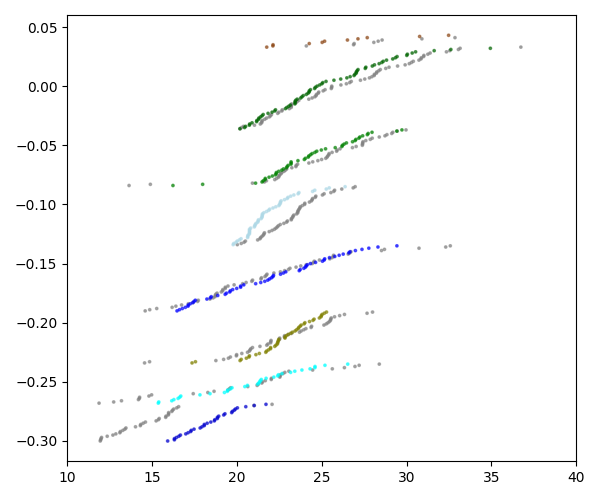

In [152]:
_no = node_order[non]

s = (toes.stack().swaplevel(0, -1).sort_index(level='sort', ascending=False).loc[_no].groupby(level=[0, 1], sort=False).apply(lambda s: s.sort_values()).droplevel([0, 1])-3000)*0.05
x = s.groupby(level=0, sort=False).apply(lambda _s: pd.Series(-0.3+np.arange(len(_s))/1000))#np.arange(len(_s))/1000)np.random.rand(len(_s))/1.5)
c = pd.Series(s.index.get_level_values('community').map(lambda x: node_c_avi[x]), index=s.index)
c.loc['FN'] = 'gray'

f, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
ax.scatter(s[['FN', 'PIR']], x[['FN', 'PIR']], c=c[['FN', 'PIR']], s=3, alpha=0.6)
# ax.set_yticks(range(len(_no)))
# ax.set_yticklabels(_no)
# ax.set_xlabel('entry time into sync cluster')
ax.set_xlim(10, 40);

The above plot is made using average entry time from node_communities data (if using toes); [or latest entry time if using toes2].

When using node_communities, the entry time is seen to be late for RE, though the node has the same number o ftransitions. For all other nodes that show fewer transitions, the entry times of all nodes is also seen to be later. This means that even though global synchrony has started increasing due to localized clusters, it takes longer for those localized clusters to transform into a synchronized unit. Perhaps in this time, the clusters break apart causing fewer transitions.

Note however, that although some networks start the main cluster later, they finish the process in an accelerated way. Thus the total transition time seems to be the same.

How do we test this hypothesis? For networks with fewer transitions, the initial phase of increasing global order should occur as frequently as FN, but then it should terminate prematurely.

To understand the relative timing of entry o fdifferent nodes see the plot below.

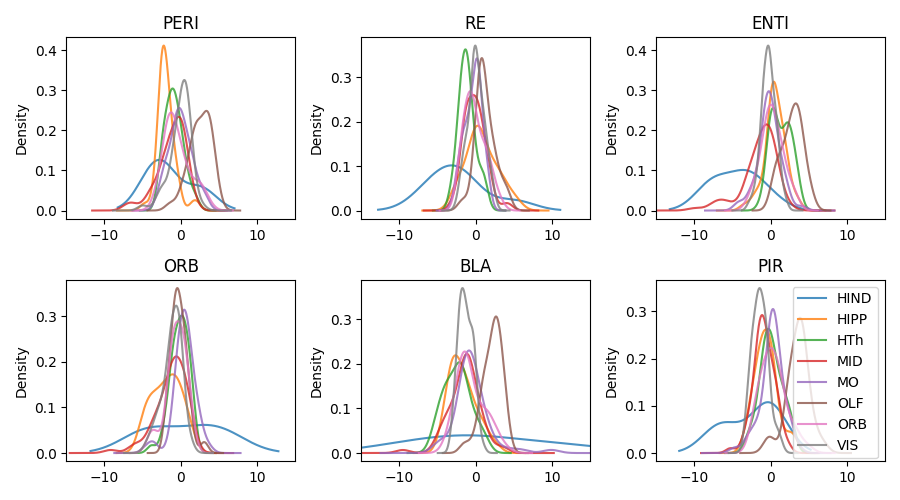

In [14]:
# entry time of different nodes in ablated networks compared to full
f, axes = plt.subplots(2, 3, figsize=(9, 5), tight_layout=True)
for n, ax in zip(node_order[1:], axes.flatten()):
    (s[n]-s['FN']).groupby('community').apply(lambda _s: _s.plot(kind='kde', ax=ax, alpha=0.8, label=_s.name))
    ax.set_xlim(-15, 15)
    ax.set_title(n)
ax.legend();

# Participation in sync cluster

In [34]:
mean_participation = metrics['high'].groupby(['noi', 'community']).mean().unstack()[fn_sync_order[::-1]]
var_participation = metrics['high'].groupby(['noi', 'community']).sem().unstack()[fn_sync_order[::-1]]
mean_participation

community,OLF,ORB,HTh,MO,VIS,HIPP,MID,HIND
noi,,,,,,,,
BLA,0.996722,0.976705,0.938038,0.834423,0.892990,0.892903,0.716651,0.343609
ENTI,0.998400,0.977688,0.942046,0.862627,0.930381,0.890093,0.763232,0.297065
FN,0.994143,0.968174,0.922772,0.870971,0.940856,0.842325,0.757904,0.328414
ORB,0.991645,0.944811,0.900152,0.839367,0.912695,0.784115,0.695703,0.295956
PERI,0.991013,0.969460,0.901567,0.835852,0.928308,0.866868,0.738910,0.303956
PIR,0.972947,0.977600,0.907084,0.897976,0.971709,0.878932,0.784432,0.305093
RE,0.991007,0.943865,0.872668,0.843962,0.880919,0.777033,0.676328,0.319350


/tmp/ipykernel_1884845/1317742539.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, ax = plt.subplots(figsize=(4, 3), tight_layout=True)


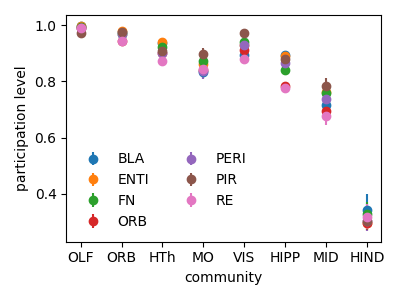

In [44]:
f, ax = plt.subplots(figsize=(4, 3), tight_layout=True)
mean_participation.T.plot(ax=ax, yerr=var_participation.T, ls='', marker='o')
ax.set_ylabel('participation level')
ax.set_xticks(range(len(mean_participation.columns)))
ax.set_xticklabels(mean_participation.columns)
ax.legend(ncol=2, frameon=False)

Most nodes do not seem to affect the participation of a particular area in the main sync cluster (significantly). Hippocampus is perhaps slightly less synchronized when RE and ORB are removed, but the rest are cirtually unaffected.  

What about individual nodes? Does their participation change?  
Some nodes do seem to participate a little less when a noi is removed. See how the participation level difference is shifted to the right in the plots below.

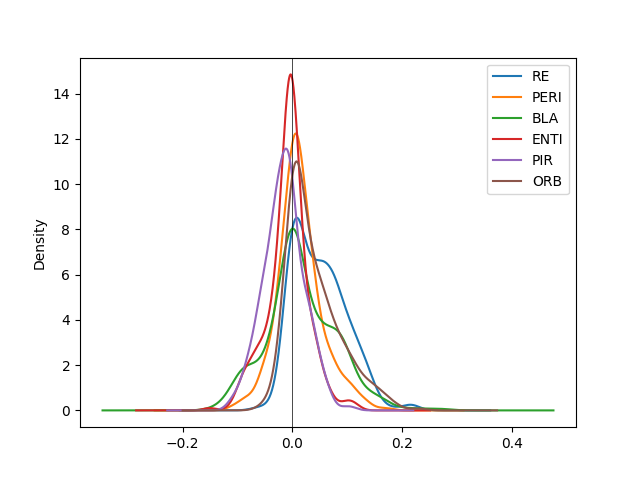

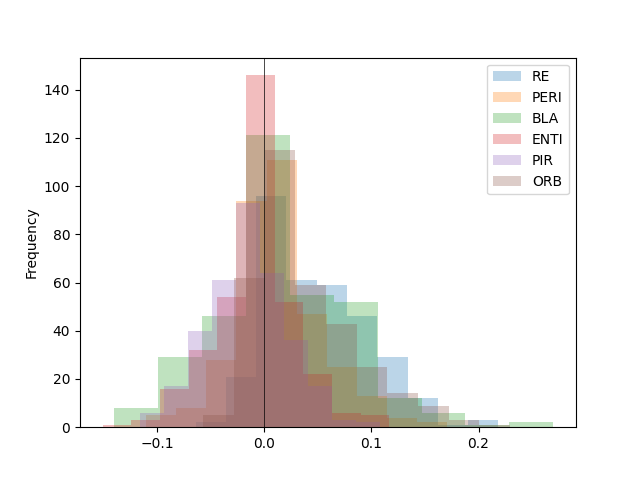

In [69]:
delta_participation = metrics['high']['FN'] - metrics['high']

f, ax = plt.subplots()
delta_participation.drop('FN', level='noi').groupby('noi', sort=False).apply(lambda s: s.plot(kind='kde', ax=ax, label=s.name))
ax.axvline(0, c='k', lw=0.5)
ax.legend();

f, ax = plt.subplots()
delta_participation.drop('FN', level='noi').groupby('noi', sort=False).apply(lambda s: s.plot(kind='hist', ax=ax, label=s.name, alpha=0.3))
ax.axvline(0, c='k', lw=0.5)
ax.legend();

# Global order value distributions

In [119]:
gos = {}
for f in glob(path.join(processed_folder, 'itr_data_*.bz2')):
    net = str.upper(path.basename(f).split('_')[2].split('.')[0])
    gos[net] = pd.read_pickle(f)

Text(0.5, 0, 'Global order')

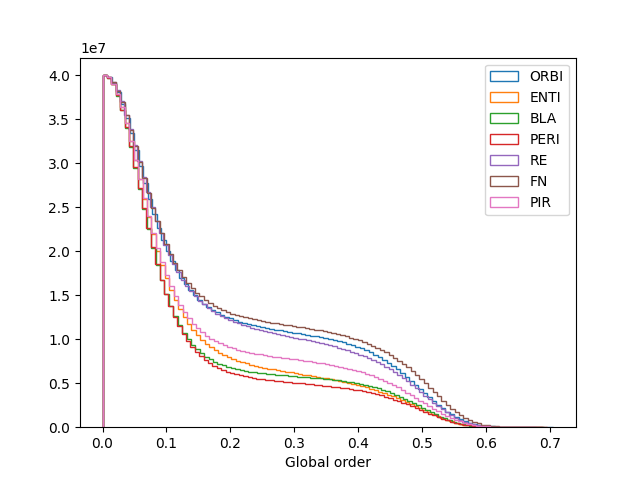

In [124]:
f, ax = plt.subplots()
for k, v in gos.items():
    v.stack().hist(ax=ax, cumulative=-1, bins=100, grid=False, histtype='step', label=k)
ax.legend()
ax.set_xlabel('Global order')

0      0      0.055152
       1      0.063663
       2      0.067147
       3      0.028334
       4      0.061788
                ...   
39999  995    0.140880
       996    0.112869
       997    0.500905
       998    0.162183
       999    0.057417
Length: 40000000, dtype: float64

In [124]:
# g_peri=pd.read_pickle('../data/raw/PERI/itr_data_peri.bz2')
g_fn=pd.read_pickle('../data/raw/FN/itr_data_fn.bz2')
# g_peri = g_peri.rolling(window=800, center=True).mean().dropna()
g_fn = g_fn.rolling(window=800, center=True).mean().dropna()

In [125]:
# g_peri_smooth = g_peri.rolling(window=5000, center=True).mean().dropna()
# peri_stats = [(g_peri_smooth>t).diff().sum().sum() for t in np.arange(0.2, 0.5, 0.05)]

g_fn_smooth = g_fn.rolling(window=5000, center=True).mean().dropna()
fn_stats = [(g_fn_smooth>t).diff().sum().sum() for t in np.arange(0.2, 0.5, 0.05)]

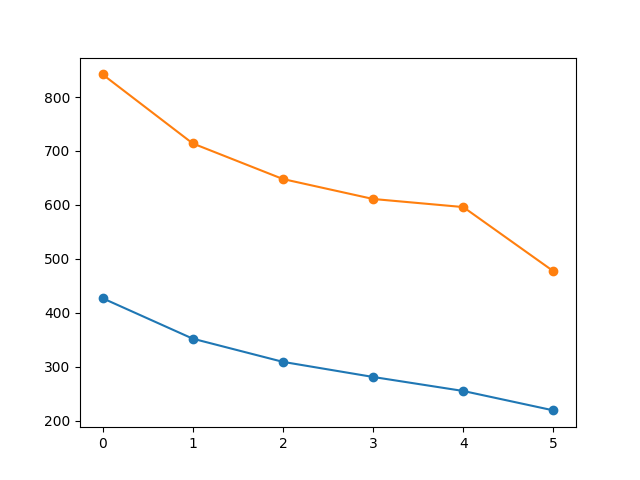

In [126]:
f, ax = plt.subplots()
ax.plot(peri_stats, '-o')
ax.plot(fn_stats, '-o')

In [37]:
lo2=pd.read_pickle('../data/raw/PERI/l200.bz2')
lo

0         1         2         3         4         5         6     \
5   0    0.157077  0.160598  0.164243  0.167994  0.171832  0.175742  0.179711   
    1    0.014478  0.014080  0.013944  0.014074  0.014469  0.015114  0.015994   
    2    0.149793  0.147797  0.145818  0.143863  0.141938  0.140049  0.138203   
    3    0.198785  0.197699  0.196459  0.195061  0.193506  0.191792  0.189918   
    4    0.152710  0.152665  0.152518  0.152271  0.151924  0.151476  0.150929   
...           ...       ...       ...       ...       ...       ...       ...   
199 421  0.317473  0.321998  0.326445  0.330809  0.335087  0.339276  0.343373   
    422  0.178687  0.180284  0.181716  0.182980  0.184076  0.185002  0.185759   
    423  0.151712  0.152070  0.152244  0.152232  0.152031  0.151639  0.151053   
    424  0.280219  0.281879  0.283343  0.284602  0.285651  0.286483  0.287091   
    425  0.195432  0.199824  0.204010  0.207981  0.211730  0.215252  0.218541   

             7         8         9     ...      4990      4991      4992  \
5   0    0.183728  0.187782  0.191867  ...  0.657623  0.656920  0.656157   
    1    0.017091  0.018388  0.019871  ...  0.377835  0.377250  0.376560   
    2    0.136404  0.134660  0.132974  ...  0.456650  0.459205  0.461634   
    3    0.187888  0.185701  0.183362  ...  0.431043  0.429522  0.427761   
    4    0.150284  0.149541  0.148703  ...  0.550049  0.551696  0.553135   
...           ...       ...       ...  ...       ...       ...       ...   
199 421  0.347373  0.351276  0.355077  ...  0.277346  0.282257  0.287078   
    422  0.186347  0.186767  0.187019  ...  0.438201  0.436499  0.434495   
    423  0.150274  0.149298  0.148125  ...  0.212096  0.213791  0.215299   
    424  0.287470  0.287614  0.287516  ...  0.211197  0.209113  0.206969   
    425  0.221594  0.224409  0.226982  ...  0.280330  0.282714  0.285252   

             4993      4994      4995      4996      4997      4998      4999  
5   0    0.655335  0.654453  0.653508  0.652500  0.651427  0.650286  0.649074  
    1    0.375769  0.374881  0.373902  0.372839  0.371695  0.370479  0.369196  
    2    0.463936  0.466107  0.468149  0.470062  0.471849  0.473514  0.475060  
    3    0.425767  0.423548  0.421113  0.418471  0.415630  0.412602  0.409398  
    4    0.554368  0.555397  0.556229  0.556871  0.557334  0.557629  0.557769  
...           ...       ...       ...       ...       ...       ...       ...  
199 421  0.291810  0.296454  0.301011  0.305484  0.309873  0.314181  0.318408  
    422  0.432192  0.429595  0.426709  0.423538  0.420091  0.416375  0.412399  
    423  0.216627  0.217781  0.218767  0.219593  0.220266  0.220792  0.221181  
    424  0.204780  0.202564  0.200337  0.198116  0.195916  0.193753  0.191639  
    425  0.287940  0.290771  0.293738  0.296834  0.300051  0.303379  0.306810  

[48138 rows x 5000 columns]

In [50]:
def get_curated_los(_lo):
    _lo = _lo[~_lo.index.duplicated()]
    _lo.index = toes.index.sort_values()
    return _lo

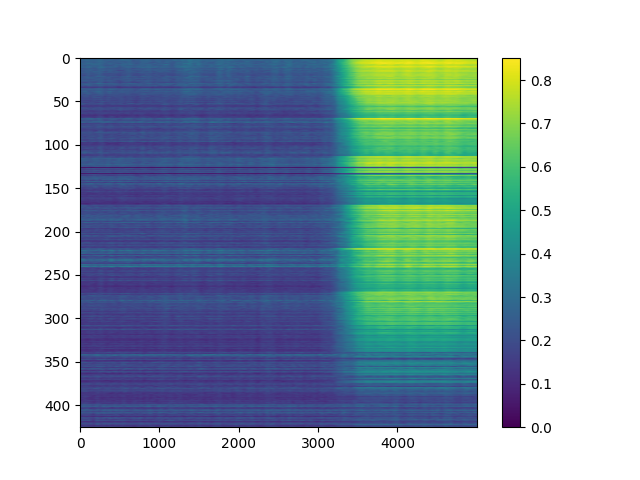

In [51]:
lo2_curated = lo2.groupby(level=0).apply(get_curated_los)
lo2_curated_mean = lo2_curated.groupby(level=[1, 2, 3]).mean().loc[toes.index]
f, ax = plt.subplots()
cb = ax.imshow(lo2_curated_mean, aspect='auto')
plt.colorbar(cb, ax=ax);

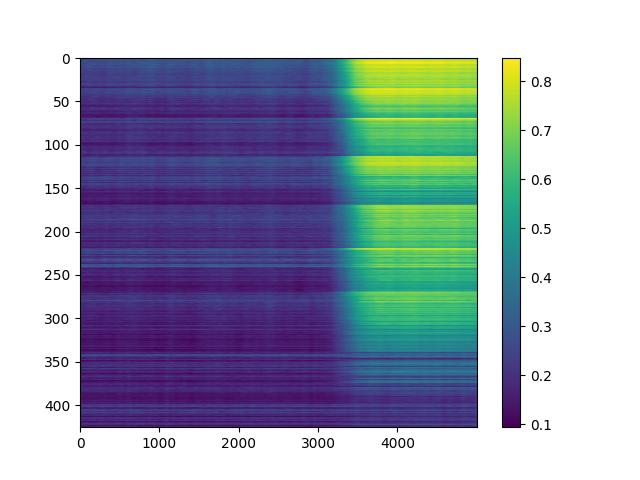

In [52]:
lo_curated = lo.groupby(level=0).apply(get_curated_los)
lo_curated_mean = lo_curated.groupby(level=[1, 2, 3]).mean().loc[toes.index]
f, ax = plt.subplots()
cb = ax.imshow(lo_curated_mean, aspect='auto')
plt.colorbar(cb, ax=ax);

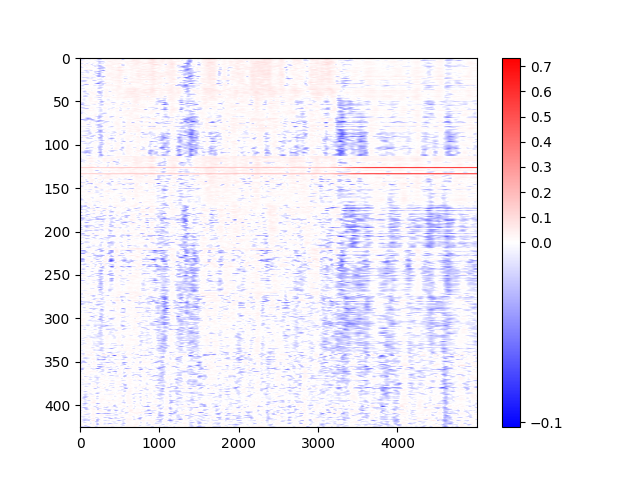

In [54]:
f, ax = plt.subplots()
cb = ax.imshow(lo_curated_mean-lo2_curated_mean, aspect='auto', cmap='bwr', norm=TwoSlopeNorm(0))
plt.colorbar(cb, ax=ax);

In [57]:
lo2.index.levels[0]

Index([  1,   8,  17,  20,  28,  31,  35,  48,  52,  53,  58,  60,  62,  65,
        66,  75,  77,  80,  83,  85,  86,  90,  92,  94,  98,  99, 100, 103,
       105, 109, 110, 121, 122, 128, 138, 140, 151, 154, 156, 157, 161, 167,
       168, 169, 170, 176, 177, 187, 188, 193, 194, 198],
      dtype='int64')

In [75]:
g_peri_cont = g_peri.stack().sort_index(level=1)

<Axes: >

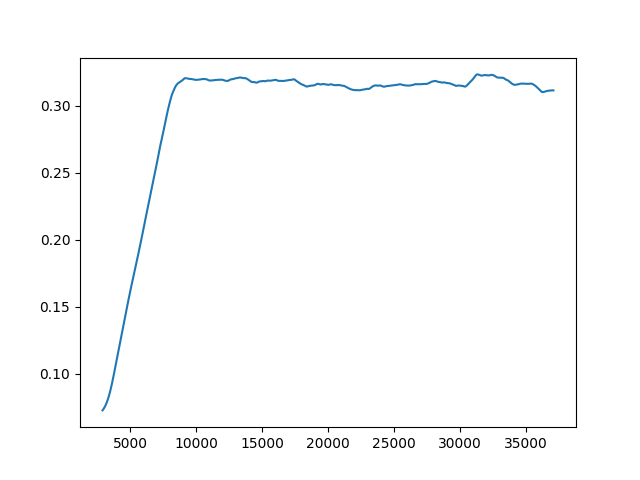

In [108]:
f, ax = plt.subplots()
g_peri_cont.xs('164', level=1).rolling(window=5000, center=True).mean().plot(ax=ax)

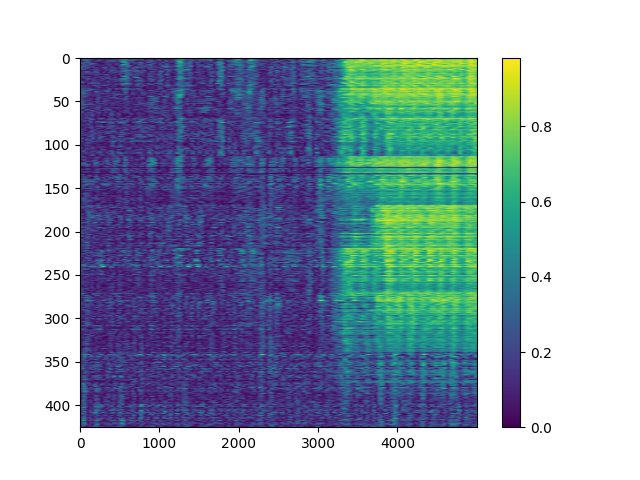

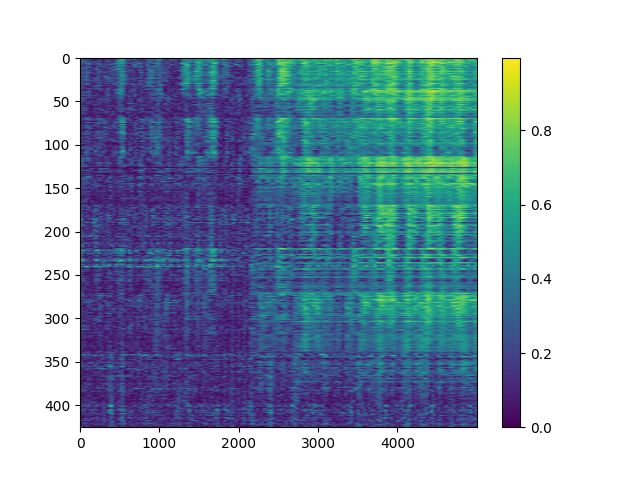

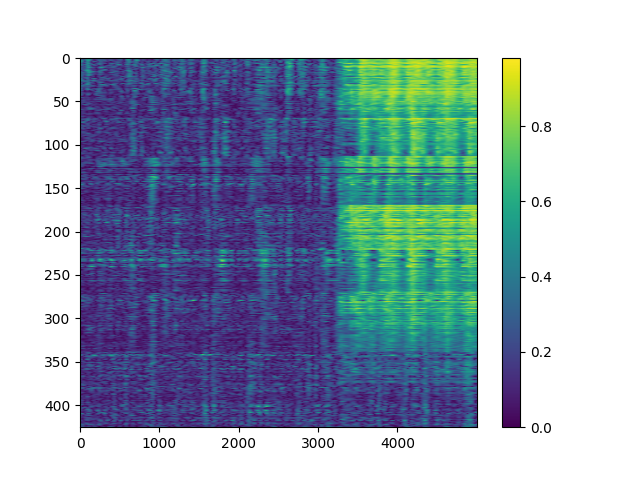

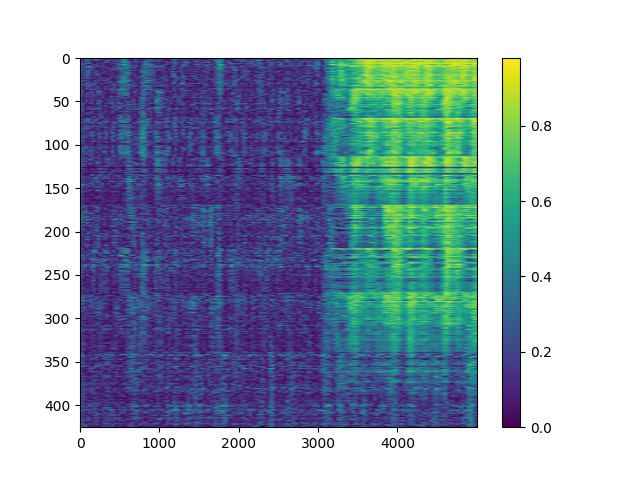

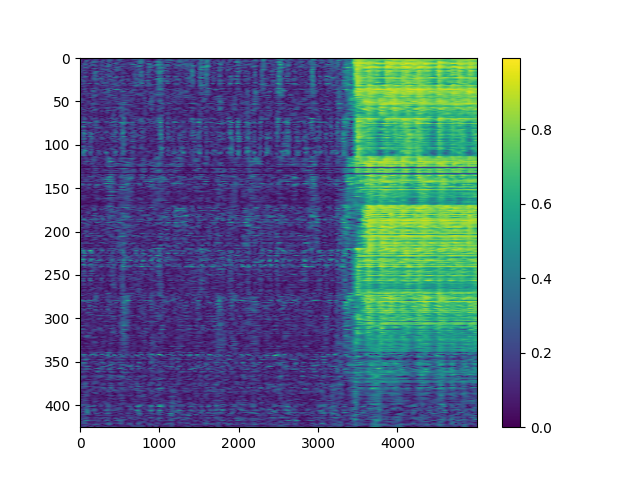

...

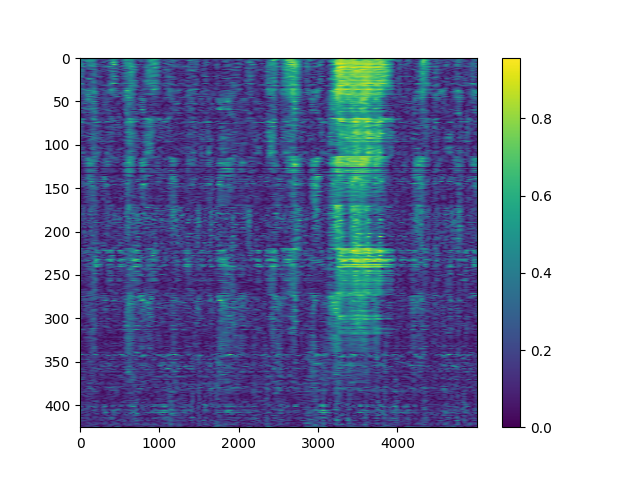

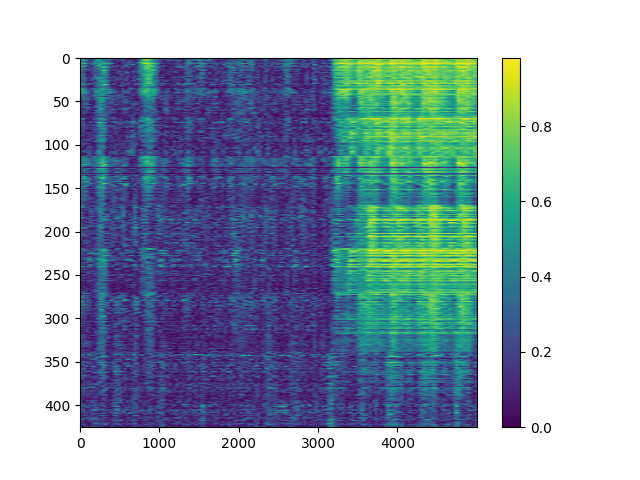

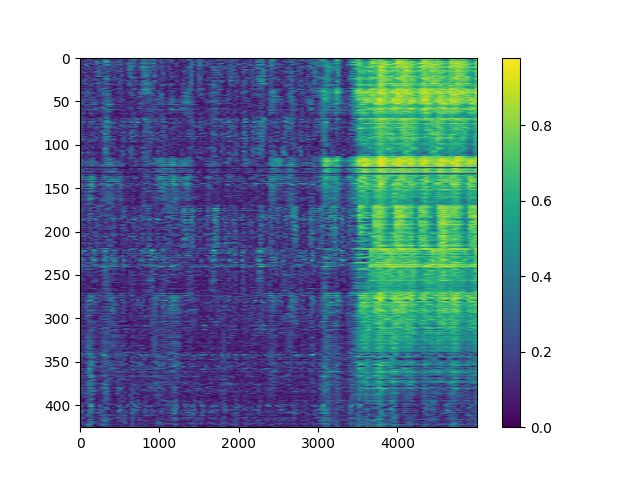

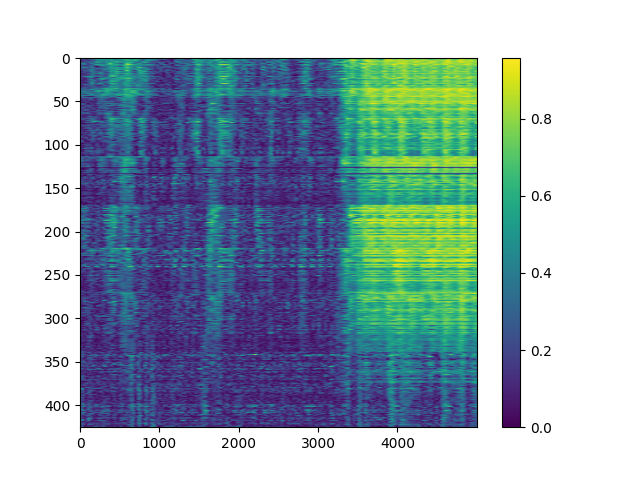

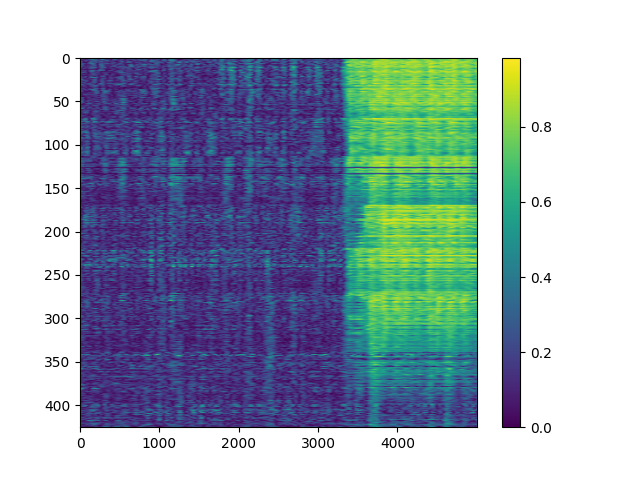

In [39]:
for i in lo2.index.levels[0][:15]:
    _lo = lo2.loc[i]
    _lo = _lo[~_lo.index.duplicated()]
    _lo.index = toes.index.sort_values()
    
    f, ax = plt.subplots()
    cb = ax.imshow(_lo.loc[toes.index], aspect='auto')
    plt.colorbar(cb, ax=ax);